<a href="https://colab.research.google.com/github/rajvsingh11/Face-Recognition-/blob/main/face_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1> Face Recognition </h1>
<p> A Face Recognition model coded in Python. This is a working model of my project. This project recognises face based on saved face data.</p>
<p> <b>Technologies/Tools</b><br>
<ul><li>OpenCV for Image Processing.</li>
<li>Keras' FaceNet model for Image Extraction.</li>
<li>Stores embeddings in Drive</li>
</ul></p>

<p> To see the actual project. Clone this Github repo. <br>https://github.com/rajvsingh11/Face-Recognition- </p>



In [ ]:
!pip install opencv-python-headless tensorflow numpy

In [ ]:
!pip install keras_facenet

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 22.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 57.4 MB/s eta 0:00:00
  Created wheel for keras_facenet: filename=keras_facenet-0.3.2-py3-none-any.whl size=10368 sha256=3f86a385e2f6ca47b1c5315abbb302c4f0f628b3db35e526838d22af9cd66d23
  Stored in directory: /root/.cache/pip/wheels/99/94/dd/cb1a65a7440ba6d508bd24346c15af0b1d24ff8b1cdb1c9959
Successfully built keras_facenet


In [39]:
import cv2
import numpy as np
import os
import tensorflow as tf
from google.colab import files, drive
from google.colab.patches import cv2_imshow
from keras_facenet import FaceNet

Mount Google Drive to save embeddings

In [ ]:
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Load pre-trained FaceNet model

In [40]:
try:
    facenet_model = FaceNet()
    print("FaceNet model loaded successfully!")
except Exception as e:
    print(f"Error loading FaceNet model: {e}")
    exit(1)

FaceNet model loaded successfully!


Load OpenCV's face detector

In [41]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')


In [42]:
def preprocess_face(img):
    img = cv2.resize(img, (160, 160))  # Resize to FaceNet input size
    img = img.astype('float32') / 255.0
    img = np.expand_dims(img, axis=0)
    return img


In [43]:
def get_face_embedding(model, face_pixels):
    face_pixels = preprocess_face(face_pixels)
    return model.embeddings(face_pixels)[0]

In [44]:
def save_embeddings(name, embedding, file='/content/drive/MyDrive/embeddings.npz'):
    try:
        data = np.load(file, allow_pickle=True)
        known_faces = list(data['embeddings'])
        known_names = list(data['names'])
    except FileNotFoundError:
        known_faces, known_names = [], []

    if name in known_names:
        print(f"{name} already exists in the database.")
        return

    known_faces.append(embedding)
    known_names.append(name)
    np.savez(file, embeddings=np.array(known_faces), names=np.array(known_names))
    print(f"Saved {name}'s face embedding.")

In [45]:
def load_embeddings(file='/content/drive/MyDrive/embeddings.npz'):
    try:
        data = np.load(file, allow_pickle=True)
        return list(data['embeddings']), list(data['names'])
    except FileNotFoundError:
        return [], []



In [46]:
def recognize_face(img, known_faces, known_names):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)

    for (x, y, w, h) in faces:
        face = img[max(0, y):min(y+h, img.shape[0]), max(0, x):min(x+w, img.shape[1])]
        embedding = get_face_embedding(facenet_model, face)

        min_dist = float('inf')
        identity = "Unknown"
        threshold = 0.8

        for i, known_embedding in enumerate(known_faces):
            dist = np.linalg.norm(embedding - known_embedding)
            if dist < min_dist:
                min_dist = dist
                identity = known_names[i]

        if min_dist >= threshold:
            identity = "Unknown"

        color = (0, 255, 0) if identity != "Unknown" else (0, 0, 255)
        cv2.rectangle(img, (x, y), (x+w, y+h), color, 2)
        cv2.putText(img, identity, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)

    return img

Load stored embeddings

In [47]:
known_faces, known_names = load_embeddings()

In [48]:
def upload_and_recognize():
    uploaded = files.upload()
    for filename in uploaded.keys():
        img = cv2.imread(filename)
        img = recognize_face(img, known_faces, known_names)
        cv2_imshow(img)



In [49]:
def upload_and_save_embedding():
    uploaded = files.upload()
    name = input("Enter the person's name: ")
    for filename in uploaded.keys():
        img = cv2.imread(filename)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        if len(faces) == 0:
            print("No face detected!")
            return

        x, y, w, h = faces[0]
        face = img[max(0, y):min(y+h, img.shape[0]), max(0, x):min(x+w, img.shape[1])]
        embedding = get_face_embedding(facenet_model, face)
        save_embeddings(name, embedding)
        known_faces, known_names = load_embeddings()

Now run `upload_and_recognize()` to recognize faces <br>
Or `upload_and_save_embedding()` to add new faces to the database

In [52]:
upload_and_save_embedding()


Saving IMG-20231112-WA0141.jpg to IMG-20231112-WA0141 (1).jpg
Enter the person's name: Raj
No face detected!


Saving IMG-20231112-WA0141.jpg to IMG-20231112-WA0141 (2).jpg


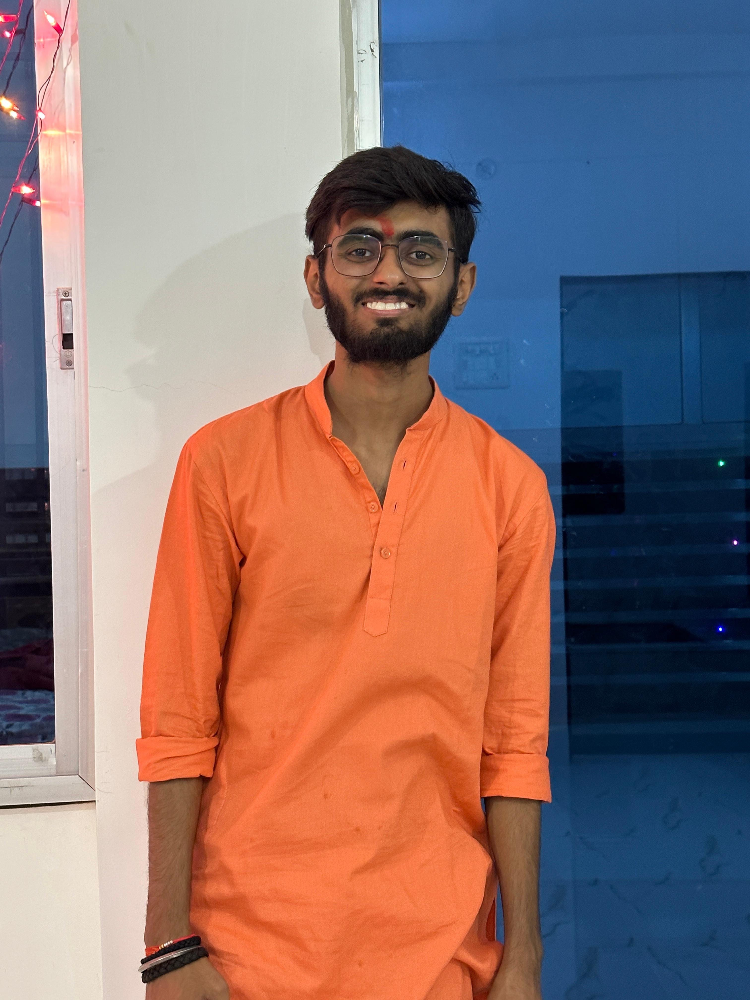

In [53]:
upload_and_recognize()
